# Covid-19 Geographic Analysis

In [1]:
import geopandas as gpd
import plotly.graph_objs as go
from plotly.offline import iplot
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# Read Shapefile
df = gpd.read_file('../Data/Shapefiles/AI_Covid_NUTS-Regions.shp')

#Specify infection column
infections = 'Total_Inf'

In [3]:
df.head()

,CNTR_CODE,ECDC_NUTS,NUTS_ID,CNTR_NAME,REG_NAME,Total_Inf,Amenity_Co,Population,km2,pop/km2,...,Doctor/p10,Kinder/p10,w18_mTemp,w32_mTemp,An_MeanTem,ND_YoY_Chg,PM25_YoY_C,NMVOC_YoY_,PM10_YoY_C,geometry
0,CZ,CZ052,CZ052,Czechia,Kralovehradecky Kraj,7513.14378,1897.0,546680,4759,115,...,0.02,0.04,10.35,18.48,10.43,-1.60,-25.24,-27.39,-20.95,"POLYGON ((16.10732 50.66207, 16.11313 50.65936..."
1,AT,AT32,AT32,Austria,Salzburg,3210.07311,4301.0,537575,7157,75,...,0.95,0.09,5.56,13.56,6.63,-32.67,-26.48,-40.17,-22.96,"POLYGON ((13.30382 48.00782, 13.30366 48.00400..."
2,ES,ES53,ES53,Spain,Illes Balears,3187.54103,5385.0,1115214,4993,223,...,0.03,0.01,18.51,24.68,18.45,-21.52,-18.23,-39.66,-21.64,"MULTIPOLYGON (((3.17671 39.95323, 3.17925 39.9..."
3,AT,AT11,AT11,Austria,Burgenland,2358.28963,1504.0,288704,3966,73,...,0.37,0.09,13.91,21.55,13.19,-13.58,-18.65,-37.27,-16.96,"POLYGON ((17.16080 48.00666, 17.13656 47.99510..."
4,AT,AT33,AT33,Austria,Tirol,4071.39213,7594.0,727191,12641,58,...,1.38,0.14,4.03,11.88,5.50,-23.94,-20.91,-42.05,-17.50,"MULTIPOLYGON (((10.45444 47.55580, 10.47320 47..."


In [4]:
print('Number of regions:', df.shape[0])
print('Number of variables:', df.shape[1]-3)

Number of regions: 401
Number of variables: 28


## Data Inspection

### Plot data values

In [5]:
x = df.REG_NAME

trace0 = go.Box(
    y=df[infections],
    x=x,
    name='kale',
    marker=dict(
        color='blue'
    )
)
data = [trace0]
layout = go.Layout(
    yaxis=dict(
        title=infections,
        zeroline=False
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)
iplot(fig)

<AxesSubplot:xlabel='Total_Inf', ylabel='Count'>

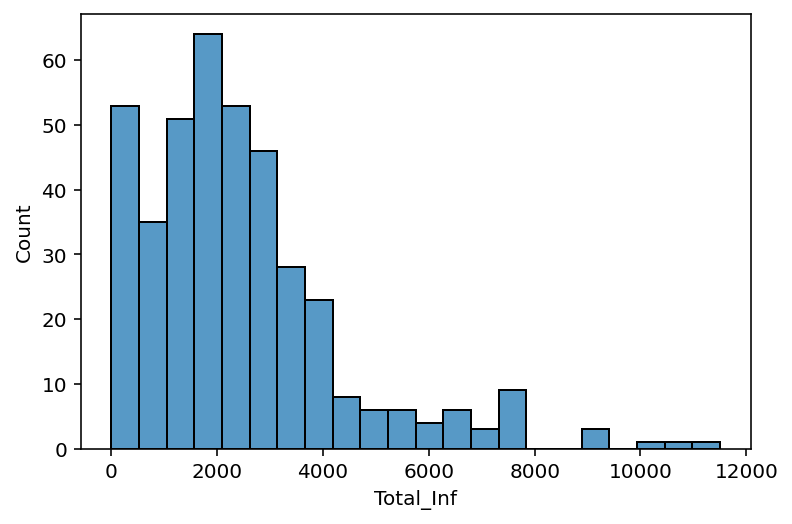

In [6]:
sns.histplot(df[infections])

### Pairplot

In [7]:
sns.pairplot(df)

### Heatmap of column correlations

<AxesSubplot:>

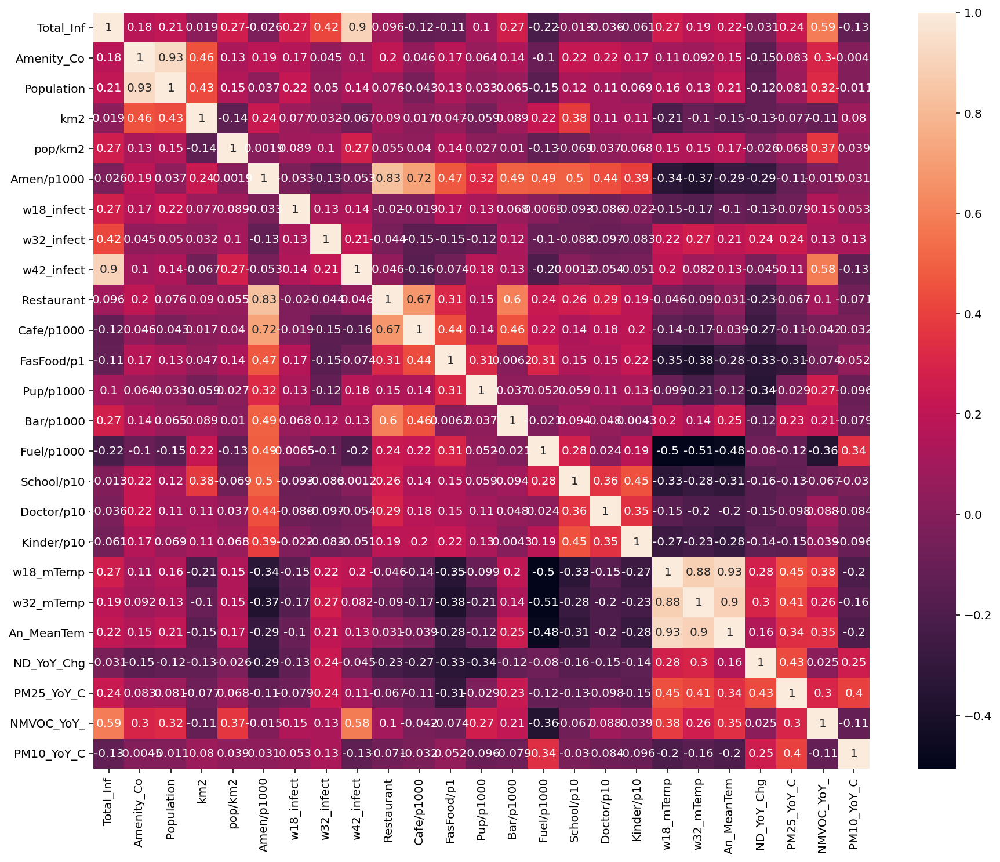

In [8]:
plt.figure(figsize=(15,12))

sns.heatmap(df.corr(), annot=True)

# Linear Relationship between variables

https://raphaelvallat.com/correlation.html

In [9]:
import pingouin as pg

In [10]:
df = gpd.read_file('../Data/Shapefiles/AI_Covid_NUTS-Regions.shp')
infections = 'Total_Inf'
df = df.drop(['w18_infect','w32_infect','w42_infect','Amenity_Co','Amen/p1000','Population','km2','w18_mTemp','w32_mTemp'], axis=1)

In [11]:
pg.corr(x=df['pop/km2'], y=df[infections])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,401,0.269593,"[0.18, 0.36]",0.07268,0.06802,4.167780e-08,2.002e+05,0.999815


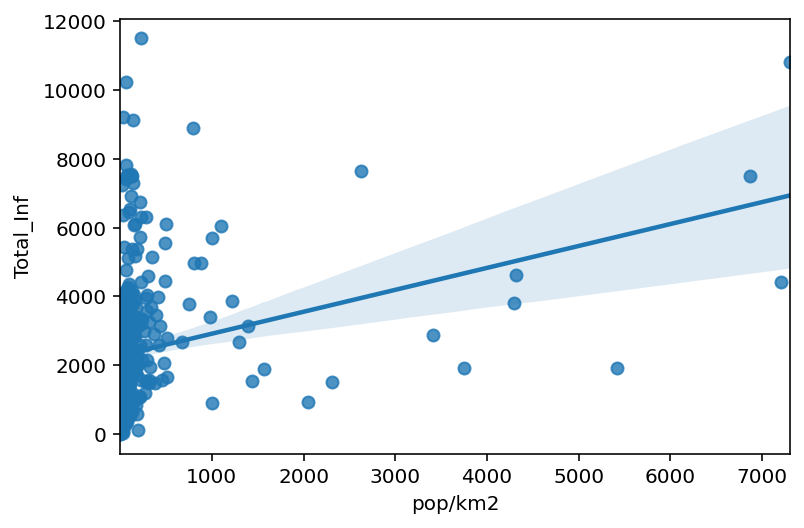

In [12]:
sns.regplot(x="pop/km2", y=infections, data=df);

# Random Forest prediction

Using a Random Forest regressor to predict the infection of the individual cities or regions, based on the indicators given in the rest of the data columns <br>

In [13]:
# Load libaries and libaries for random forest
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

from sklearn import preprocessing
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, r2_score, mean_absolute_error
from sklearn import metrics

In [14]:
# Read Shapefile
df = gpd.read_file('../Data/Shapefiles/AI_Covid_NUTS-Regions.shp')

#Specify infection column (column to predict)
infections = 'Total_Inf'

In [15]:
# Selecting columns of value types, dropping all string columns (only values can be used the prediction)  
df = df.select_dtypes(include=['float64','int64'])

# Drop specific columns should not be included in the model
df = df.drop(['w18_infect','w32_infect','w42_infect','Amenity_Co','Amen/p1000','Population','km2','w18_mTemp','w32_mTemp'], axis=1)

print('Column to predict:', infections)
print('Number of regions:', df.shape[0])
print('Number of variables:', df.shape[1])
print('Dataframe shape:', df.shape)
df.head()

Column to predict: Total_Inf
Number of regions: 401
Number of variables: 16
Dataframe shape: (401, 16)


,Total_Inf,pop/km2,Restaurant,Cafe/p1000,FasFood/p1,Pup/p1000,Bar/p1000,Fuel/p1000,School/p10,Doctor/p10,Kinder/p10,An_MeanTem,ND_YoY_Chg,PM25_YoY_C,NMVOC_YoY_,PM10_YoY_C
0,7513.14378,115,0.84,0.13,0.12,0.24,0.12,0.18,0.11,0.02,0.04,10.43,-1.60,-25.24,-27.39,-20.95
1,3210.07311,75,1.91,0.52,0.24,0.24,0.32,0.16,0.17,0.95,0.09,6.63,-32.67,-26.48,-40.17,-22.96
2,3187.54103,223,1.66,0.97,0.19,0.12,0.40,0.11,0.06,0.03,0.01,18.45,-21.52,-18.23,-39.66,-21.64
3,2358.28963,73,1.31,0.37,0.09,0.12,0.11,0.26,0.16,0.37,0.09,13.19,-13.58,-18.65,-37.27,-16.96
4,4071.39213,58,2.30,0.70,0.31,0.21,0.34,0.19,0.40,1.38,0.14,5.50,-23.94,-20.91,-42.05,-17.50


#### Dataframe column normalization

In [16]:
scaler = preprocessing.MinMaxScaler()
df_normal = scaler.fit_transform(df)
df_normal = pd.DataFrame(df_normal)

In [17]:
#df.describe()
pd.DataFrame(df_normal).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
count,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000,401.000000
mean,0.211793,0.034563,0.133887,0.206337,0.131017,0.191708,0.105073,0.077097,0.146148,0.032292,0.045044,0.573086,0.309062,0.472576,0.516509,0.292850
std,0.165821,0.110351,0.119113,0.177828,0.125190,0.209206,0.135425,0.089754,0.130427,0.074910,0.068919,0.178600,0.154485,0.175660,0.114273,0.153929
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.101866,0.005206,0.052632,0.086331,0.048276,0.050000,0.025210,0.032710,0.065789,0.005102,0.010417,0.477497,0.207570,0.361752,0.447275,0.181484
50%,0.178232,0.009864,0.107551,0.165468,0.103448,0.112500,0.058824,0.051402,0.118421,0.010204,0.031250,0.575192,0.276659,0.476684,0.504353,0.272634
75%,0.270840,0.018633,0.178490,0.251799,0.179310,0.250000,0.117647,0.088785,0.184211,0.025510,0.052083,0.690450,0.377290,0.588554,0.583521,0.385449
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [18]:
#For iteration, filter columns with high variance importance. Inlucde 0! This is infection column
#df_normal = df_normal.filter([0,20,4,19,7,18], axis=1)

# Creating training and test data for the model
X=df_normal.drop([0], axis=1)
y=df_normal[0]

In [19]:
# Specify train/test split (test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [20]:
# Specify number of trees in the model (n_estimators)
rf=RandomForestRegressor(n_estimators=200)

In [21]:
rf.fit(X_train,y_train)

RandomForestRegressor(n_estimators=200)

In [22]:
pred=rf.predict(X_test)

#### Plot model prediction results

Orange is predicted values, blue is test data true values

Text(0.5, 1.0, 'EU-regions Covid-19 Random Forest prediction')

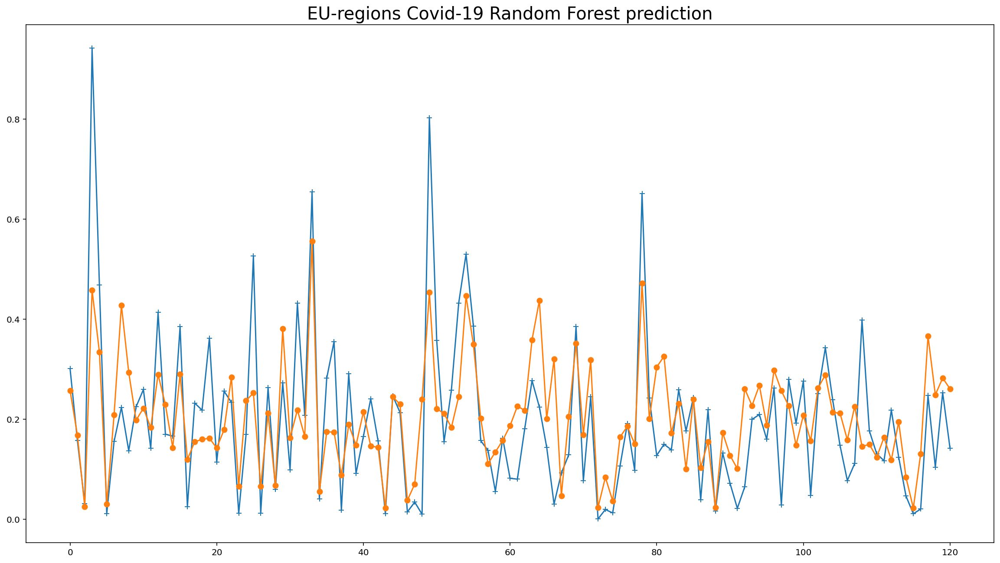

In [23]:
plt.figure(figsize=(20,11))

plt.plot(range(0, y_test.shape[0]), y_test, marker='+')
plt.plot(range(0, pred.shape[0]), pred, marker='o')
plt.title('EU-regions Covid-19 Random Forest prediction', fontsize=20)
#plt.savefig('../RandomForest_Predict.png')

In [24]:
# Model accuracy
rf_accuracy = rf.score(X_test, y_test)
rf_r2 = r2_score(y_test, pred)
rf_mae = mean_absolute_error(y_test, pred)
print('Model accuracy:', rf_accuracy)
print('Model R2-score:', rf_r2)
print('Model MAE:', rf_mae)

Model accuracy: 0.506248380901178
Model R2-score: 0.506248380901178
Model MAE: 0.08257093009660542


### Get variable importance

Feature ranking (Column):
1. feature 13 (0.366933) 14
2. feature 0 (0.092888) 1
3. feature 3 (0.062344) 4
4. feature 11 (0.053732) 12
5. feature 12 (0.053124) 13
6. feature 5 (0.049693) 6
7. feature 2 (0.047283) 3
8. feature 7 (0.044360) 8
9. feature 6 (0.042615) 7
10. feature 4 (0.040177) 5
11. feature 10 (0.039824) 11
12. feature 14 (0.037571) 15
13. feature 1 (0.027768) 2
14. feature 8 (0.027198) 9
15. feature 9 (0.014490) 10


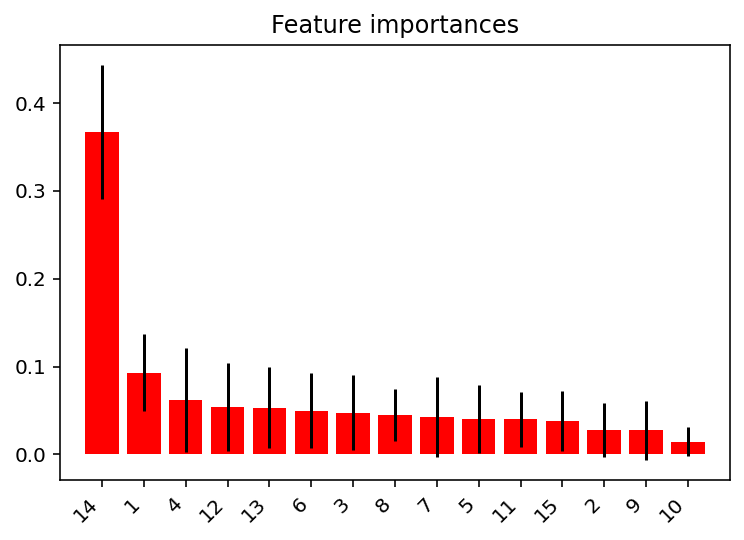

In [25]:
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]
indices_name = X.columns[indices]

# Print the feature ranking
print("Feature ranking (Column):")

for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]), X.columns[indices[f]])

# Plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
        color="r", yerr=std[indices], align="center")
#plt.xticks(range(X.shape[1]), indices)
plt.xticks(range(X.shape[1]), indices_name, rotation=45, horizontalalignment="right")
plt.xlim([-1, X.shape[1]])
plt.show()
#print(indices_name)

# Lasso prediction

In [26]:
# Import libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso

### Load data - Skip this column if the RF data input shoud remain the same

In [27]:
# Read Shapefile
df = gpd.read_file('../Data/Shapefiles/AI_Covid_NUTS-Regions.shp')

#Specify infection column (column to predict)
infections = 'Total_Inf'

# Selecting columns of value types, dropping all string columns (only values can be used the prediction)  
df = df.select_dtypes(include=['float64','int64'])

# Drop specific columns should not be included in the model
df = df.drop(['w18_infect','w32_infect','w42_infect','Amenity_Co','Amen/p1000','Population','km2','w18_mTemp','w32_mTemp'], axis=1)

In [28]:
scaler = preprocessing.MinMaxScaler()
df_normal = scaler.fit_transform(df)
df_normal = pd.DataFrame(df_normal)

In [29]:
# Creating training and test data for the model
X=df_normal.drop([0], axis=1)
y=df_normal[0]

In [30]:
# Specify train/test split (test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [31]:
model_lasso = Lasso(alpha=0.001)

In [32]:
model_lasso.fit(X_train, y_train)

Lasso(alpha=0.001)

In [33]:
pred_train_lasso = model_lasso.predict(X_test)

Text(0.5, 1.0, 'EU-regions Covid-19 Lasso prediction')

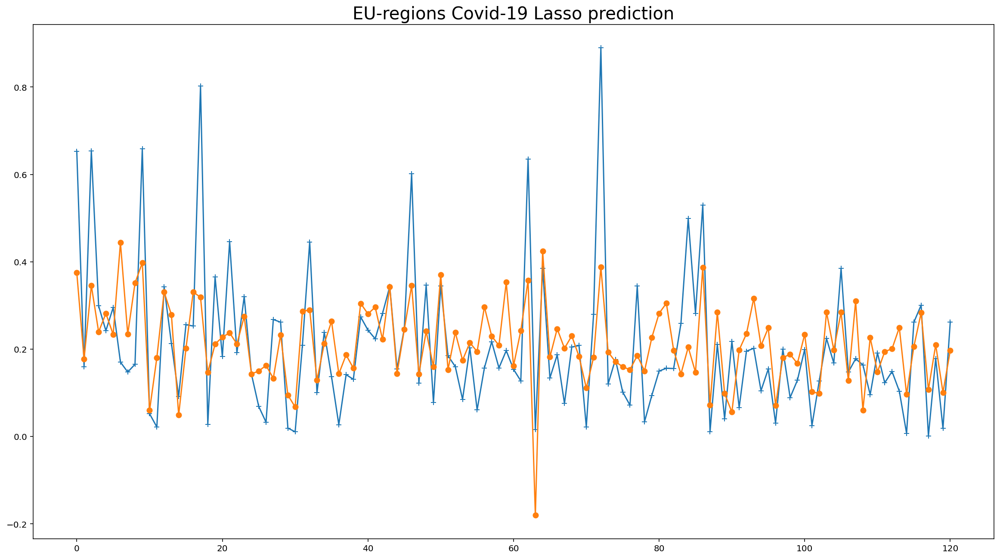

In [34]:
plt.figure(figsize=(20,11))

plt.plot(range(0, y_test.shape[0]), y_test, marker='+')
plt.plot(range(0, pred_train_lasso.shape[0]), pred_train_lasso, marker='o')
plt.title('EU-regions Covid-19 Lasso prediction', fontsize=20)
#plt.savefig('../Lasso_Predict.png')

In [35]:
# Model accuracy
lasso_accuracy = model_lasso.score(X_test, y_test)
lasso_r2 = r2_score(y_test, pred_train_lasso)
lasso_mae = mean_absolute_error(y_test, pred_train_lasso)
print('Lasso Model accuracy:', lasso_accuracy)
print('R2-score:', lasso_r2)
print('MAE:', lasso_mae)

Lasso Model accuracy: 0.4054819613339661
R2-score: 0.4054819613339661
MAE: 0.09369302388894847


# SVR prediction

In [36]:
# Import libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR

### Load data - Skip this column if the data input shoud remain the same

In [37]:
# Read Shapefile
df = gpd.read_file('../Data/Shapefiles/AI_Covid_NUTS-Regions.shp')

#Specify infection column (column to predict)
infections = 'Total_Inf'

# Selecting columns of value types, dropping all string columns (only values can be used the prediction)  
df = df.select_dtypes(include=['float64','int64'])

# Drop specific columns should not be included in the model
df = df.drop(['fid','cases','population','km2'], axis=1)

In [38]:
scaler = preprocessing.MinMaxScaler()
df_normal = scaler.fit_transform(df)
df_normal = pd.DataFrame(df_normal)

In [39]:
# Creating training and test data for the model
X=df_normal.drop([0], axis=1)
y=df_normal[0]

In [40]:
# Specify train/test split (test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [41]:
svr_rbf = SVR(kernel='rbf', C=1e1, gamma='scale')

In [42]:
svr_rbf.fit(X_train, y_train)

SVR(C=10.0)

In [43]:
svr_pred = svr_rbf.predict(X_test)

Text(0.5, 1.0, 'EU-regions Covid-19 SVR prediction')

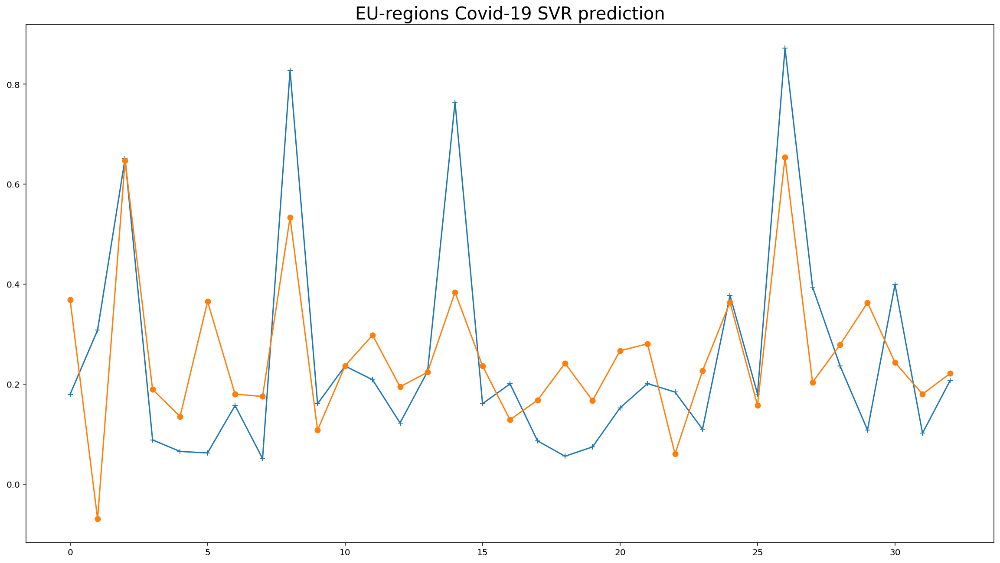

In [44]:
plt.figure(figsize=(20,11))

plt.plot(range(0, y_test.shape[0]), y_test, marker='+')
plt.plot(range(0, svr_pred.shape[0]), svr_pred, marker='o')
plt.title('EU-regions Covid-19 SVR prediction', fontsize=20)
#plt.savefig('../SVR_Predict.png')

In [45]:
# Model accuracy
svr_accuracy = svr_rbf.score(X_test, y_test)
svr_r2 = r2_score(y_test, svr_pred)
svr_mae = mean_absolute_error(y_test, svr_pred)
print('SVR Model accuracy:', svr_accuracy)
print('R2-score:', svr_r2)
print('MAE:', svr_mae)

SVR Model accuracy: 0.46648670050513474
R2-score: 0.46648670050513474
MAE: 0.12174540865899192
